<center> Detecting Cryptocurrency Fraud with Graph Embeddings </center>
<center> Barcelona School of Economics Class '22 </center>
<center> Master Project </center>

***
    - Sarah Spiteri
    - Cristina Susanu
    - Andrés Virgüez
***






Financial institutions are starting to integrate their digital payment systems with with cryptocurrency markets. A challenge that these institutions face when operating in crypto environments consists in avoiding carrying out transactions with accounts that are involved with fraudulent activities (drug dealing, terrorism, ransomware, etc.).


In light of this challenge, a number of credit rating agencies have started to provide fraudulent scores of Bitcoin addresses to help financial institutions decide whether they should engage in a transaction with a given address or not.


The objective of this project consists in extracting covariates associated with Bitcoin addresses via graph embeddings from the bitcoin blockchain and then use these covariates to predict fraudulent addresses using a sample of labelled fraudulent addresses.

In [1]:
# General imports
import os,sys,inspect
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import pandas as pd
import numpy as np
import zipfile
import seaborn as sns 
from datetime import datetime
from functools import reduce
from time import time
import matplotlib.dates as mdates
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
import plotly.offline as py 
%matplotlib inline
import random
import string
import pickle
import re
import math
import random as rd

# Shared instances
# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

import warnings
warnings.filterwarnings('ignore')

from IPython.core.display import display, HTML
display(HTML("<style>.container {width:80% !important; }</style>"))

from custom_functions import *
from subsample_pipeline import *
from node_embedding_pipeline import *

Metal device set to: Apple M1 Pro


2022-06-27 12:54:00.588894: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-06-27 12:54:00.589005: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Loading BokehJS ...

Loading BokehJS ...

Loading BokehJS ...

In [36]:
# Declare filename
filename = r'trans_3w.csv'

# Define working parameters for node2vec algorithm to extract embedded features
walk_count = 20
walk_length = 5
p = 0.25
q = 0.75
batch_size = 32
epochs = 3
emb_size = 64

# Assign target variable
target_variable = 'flag'

# Define classes of target variable 
class_labels = ['Licit', 'Fraudulent']

# Drop columns from training dataframe
columns_to_drop = ['address', 'input_flag', 'output_flag'] 

# Set size of the test set
test_size = 0.2

# Choose best sampled graph 

In [3]:
# Execute prediction pipeline for ten different subsamples to identify the subgraph with best classification results
subsample_pipeline(filename, test_size, walk_count, walk_length, p, q, batch_size, epochs, emb_size, columns_to_drop, target_variable)

Execute pipeline for file: trans_3w.csv
Initial shape:  (14033260, 9)
Shape without NaN:  (14033121, 9)
Shape without negative amounts:  (13962365, 9)
Number of self-loops:  1433203
Sample:  1
Number of nodes: 29672
Number of edges: 53476
Target variable distribution within the subsampled edges:


0    45518
1     7958
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    27423
1     2249
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/29672 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████| 5/5 [00:05<00:00,  1.12s/it]


Embeddings dataframe shape:  (29672, 64)
Results sample  1


,LR,RF
ROC AUC,0.646916,0.694759
Recall,0.557870,0.446759
Precision,0.142267,0.379921
F1 Score,0.226717,0.410638


Sample:  2
Number of nodes: 29494
Number of edges: 53550
Target variable distribution within the subsampled edges:


0    45037
1     8513
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    27218
1     2276
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/29494 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████| 5/5 [00:05<00:00,  1.16s/it]


Embeddings dataframe shape:  (29494, 64)
Results sample  2


,LR,RF
ROC AUC,0.686675,0.707946
Recall,0.636364,0.465368
Precision,0.170534,0.444215
F1 Score,0.268984,0.454545


Sample:  3
Number of nodes: 29174
Number of edges: 51985
Target variable distribution within the subsampled edges:


0    44005
1     7980
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    26888
1     2286
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/29174 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████| 5/5 [00:05<00:00,  1.14s/it]


Embeddings dataframe shape:  (29174, 64)
Results sample  3


,LR,RF
ROC AUC,0.668525,0.685703
Recall,0.585417,0.425000
Precision,0.174426,0.415479
F1 Score,0.268771,0.420185


Sample:  4
Number of nodes: 29237
Number of edges: 53022
Target variable distribution within the subsampled edges:


0    44572
1     8450
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    26977
1     2260
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/29237 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████| 5/5 [00:05<00:00,  1.13s/it]


Embeddings dataframe shape:  (29237, 64)
Results sample  4


,LR,RF
ROC AUC,0.661458,0.690202
Recall,0.583519,0.436526
Precision,0.156980,0.392786
F1 Score,0.247403,0.413502


Sample:  5
Number of nodes: 29506
Number of edges: 52409
Target variable distribution within the subsampled edges:


0    44369
1     8040
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    27313
1     2193
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/29506 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████| 5/5 [00:05<00:00,  1.11s/it]


Embeddings dataframe shape:  (29506, 64)
Results sample  5


,LR,RF
ROC AUC,0.678633,0.700128
Recall,0.609412,0.454118
Precision,0.157927,0.395492
F1 Score,0.250847,0.422782


Sample:  6
Number of nodes: 29422
Number of edges: 53704
Target variable distribution within the subsampled edges:


0    45215
1     8489
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    27175
1     2247
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/29422 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████| 5/5 [00:05<00:00,  1.12s/it]


Embeddings dataframe shape:  (29422, 64)
Results sample  6


,LR,RF
ROC AUC,0.666242,0.698095
Recall,0.584091,0.450000
Precision,0.157959,0.403259
F1 Score,0.248670,0.425349


Sample:  7
Number of nodes: 29731
Number of edges: 55460
Target variable distribution within the subsampled edges:


0    46600
1     8860
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    27441
1     2290
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/29731 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████| 5/5 [00:05<00:00,  1.14s/it]


Embeddings dataframe shape:  (29731, 64)
Results sample  7


,LR,RF
ROC AUC,0.640853,0.695051
Recall,0.534562,0.444700
Precision,0.142681,0.390688
F1 Score,0.225243,0.415948


Sample:  8
Number of nodes: 30034
Number of edges: 55814
Target variable distribution within the subsampled edges:


0    47643
1     8171
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    27823
1     2211
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/30034 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████| 5/5 [00:05<00:00,  1.20s/it]


Embeddings dataframe shape:  (30034, 64)
Results sample  8


,LR,RF
ROC AUC,0.696596,0.713606
Recall,0.646635,0.478365
Precision,0.159549,0.410309
F1 Score,0.255947,0.441731


Sample:  9
Number of nodes: 29356
Number of edges: 52969
Target variable distribution within the subsampled edges:


0    44486
1     8483
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    27110
1     2246
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/29356 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████| 5/5 [00:05<00:00,  1.14s/it]


Embeddings dataframe shape:  (29356, 64)
Results sample  9


,LR,RF
ROC AUC,0.671283,0.696504
Recall,0.604651,0.448203
Precision,0.168136,0.415686
F1 Score,0.263109,0.431333


Sample:  10
Number of nodes: 29244
Number of edges: 52974
Target variable distribution within the subsampled edges:


0    44844
1     8130
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    26992
1     2252
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/29244 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|██████████████████| 5/5 [00:05<00:00,  1.11s/it]


Embeddings dataframe shape:  (29244, 64)
Results sample  10


,LR,RF
ROC AUC,0.656785,0.693011
Recall,0.560086,0.435622
Precision,0.164358,0.431915
F1 Score,0.254138,0.433761


# Extract embeddings

## Node2Vec

In [25]:
# Set best sampled graph based on out-sample recall score
subsample = 'Outputs/sample_8.csv'

Initial shape:  (14033260, 9)
Shape without NaN:  (14033121, 9)
Shape without negative amounts:  (13962365, 9)
Number of self-loops:  1433203
Number of nodes: 30034
Number of edges: 55814
Target variable distribution within the subsampled edges:


0    47643
1     8171
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    27823
1     2211
Name: flag, dtype: int64

Computing transition probabilities:   0%|          | 0/30034 [00:00<?, ?it/s]

Generating walks (CPU: 1): 100%|████████████████| 20/20 [00:39<00:00,  2.00s/it]


Embeddings dataframe shape:  (30034, 64)
Distribution of classes for subsampled nodes


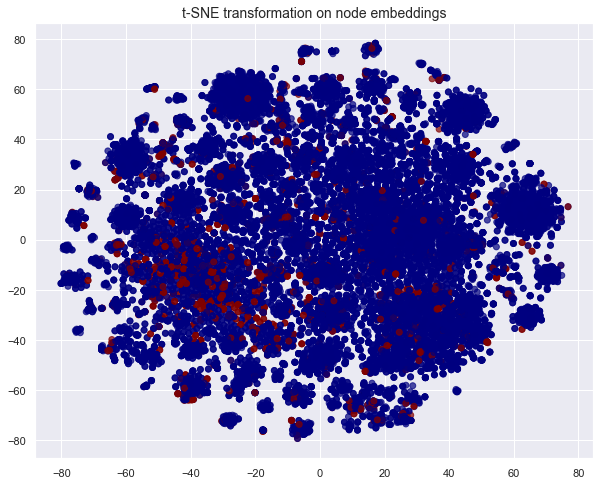

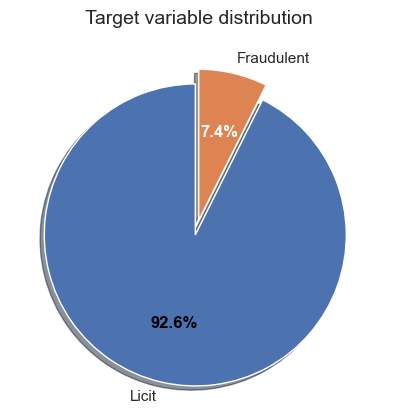

Distribution of classes for subsampled edges


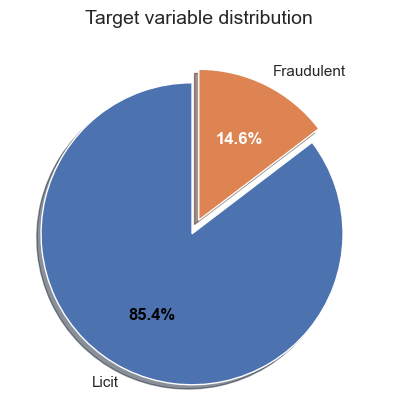

,level_0,level_1,0
2,input_flag,flag,0.276985
4,input_flag,feature_2,-0.029412
5,input_flag,feature_3,-0.028465
6,input_flag,feature_4,-0.036282
7,input_flag,feature_5,0.038558
...,...,...,...
8090,diff_fees,inf_max,-0.060098
8093,diff_fees,outf_total,-0.092744
8094,diff_fees,outf_std,0.074204
8095,diff_fees,outf_max,0.250526


In [37]:
# Execute pipeline to extract embeddings and create train/test datasets
X_train_original, X_train, X_test, y_train, y_test = node_embedding_pipeline(filename, subsample, test_size, walk_count, walk_length, p, q, batch_size, epochs, emb_size, columns_to_drop, target_variable)

## Trans2Vec

Initial shape:  (14033260, 9)
Shape without NaN:  (14033121, 9)
Shape without negative amounts:  (13962365, 9)
Number of self-loops:  1433203
Number of nodes: 30034
Number of edges: 55814
Target variable distribution within the subsampled edges:


0    47643
1     8171
Name: flag, dtype: int64

Target variable distribution within the subsampled nodes:


0    27823
1     2211
Name: flag, dtype: int64

Embeddings dataframe shape:  (30034, 65)
Distribution of classes for subsampled nodes


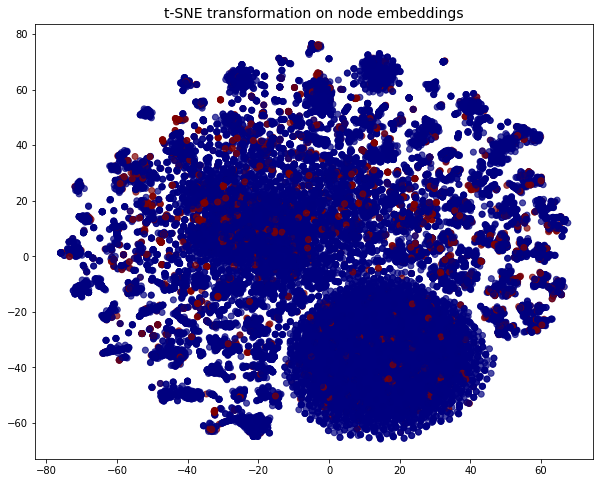

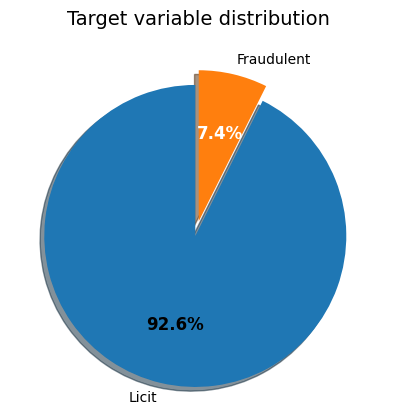

Distribution of classes for subsampled edges


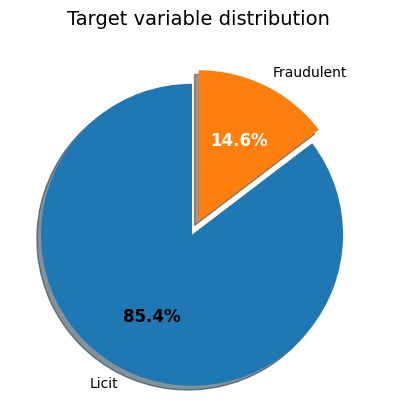

,level_0,level_1,0
2,input_flag,flag,0.276985
4,input_flag,feature_2,-0.053693
6,input_flag,feature_4,0.050199
7,input_flag,feature_5,0.037146
8,input_flag,feature_6,-0.071128
...,...,...,...
8090,diff_fees,inf_max,-0.060098
8093,diff_fees,outf_total,-0.092744
8094,diff_fees,outf_std,0.074204
8095,diff_fees,outf_max,0.250526


In [7]:
# Execute pipeline to extract embeddings and create train/test datasets
X_train_original_2, X_train_2, X_test_2, y_train_2, y_test_2 = trans2vec_pipeline(filename, subsample, test_size, columns_to_drop, target_variable)

# Run classifier 

## Node2Vec 

In [38]:
# Run grid search over different algorithm and create dictionary of scores
scores = run_models(X_train, X_test, y_train, y_test)

Grid-Searching for model KNN...
Best model fitted
KNN chosen hyperparameters: {'n_neighbors': 5, 'weights': 'distance'}
KNN F1 score on train sample: 0.9325608679252502
KNN F1 score on test sample: 0.38559639909977494

Grid-Searching for model LogisticRegression...
Best model fitted
LogisticRegression chosen hyperparameters: {'C': 5, 'max_iter': 10000, 'penalty': 'l2', 'solver': 'lbfgs'}
LogisticRegression F1 score on train sample: 0.694975481982276
LogisticRegression F1 score on test sample: 0.2711198428290766

Grid-Searching for model RandomForest...
Best model fitted
RandomForest chosen hyperparameters: {'max_depth': 5, 'max_features': 4, 'min_samples_leaf': 6, 'n_estimators': 130, 'random_state': 9876}
RandomForest F1 score on train sample: 0.7536022941618359
RandomForest F1 score on test sample: 0.23788187372708758

Grid-Searching for model XGB...


/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


Best model fitted
XGB chosen hyperparameters: {'eval_metric': 'auc', 'lambda': 1.5, 'learning_rate': 1, 'max_depth': 8, 'objective': 'binary:logistic', 'seed': 9876, 'use_label_encoder': False}
XGB F1 score on train sample: 0.9707166765352028
XGB F1 score on test sample: 0.5024509803921569



## Trans2Vec

In [9]:
# Run grid search over different algorithm and create dictionary of scores
scores_2 = run_models(X_train_2, X_test_2, y_train_2, y_test_2)

Grid-Searching for model KNN...
Best model fitted
KNN chosen hyperparameters: {'n_neighbors': 5, 'weights': 'distance'}
KNN F1 score on train sample: 0.8813736933360197
KNN F1 score on test sample: 0.22848360655737704

Grid-Searching for model LogisticRegression...
Best model fitted
LogisticRegression chosen hyperparameters: {'C': 5, 'max_iter': 10000, 'penalty': 'l2', 'solver': 'saga'}
LogisticRegression F1 score on train sample: 0.6510337143707422
LogisticRegression F1 score on test sample: 0.24242424242424243

Grid-Searching for model RandomForest...


/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


Best model fitted
RandomForest chosen hyperparameters: {'max_depth': 5, 'max_features': 6, 'min_samples_leaf': 6, 'n_estimators': 100, 'random_state': 9876}
RandomForest F1 score on train sample: 0.7500904495112706
RandomForest F1 score on test sample: 0.2214336408800568

Grid-Searching for model XGB...
Best model fitted
XGB chosen hyperparameters: {'eval_metric': 'auc', 'lambda': 1.5, 'learning_rate': 1, 'max_depth': 8, 'objective': 'binary:logistic', 'seed': 9876, 'use_label_encoder': False}
XGB F1 score on train sample: 0.9593679382663692
XGB F1 score on test sample: 0.3321718931475029



# Assess accuracy 

## Node2Vec

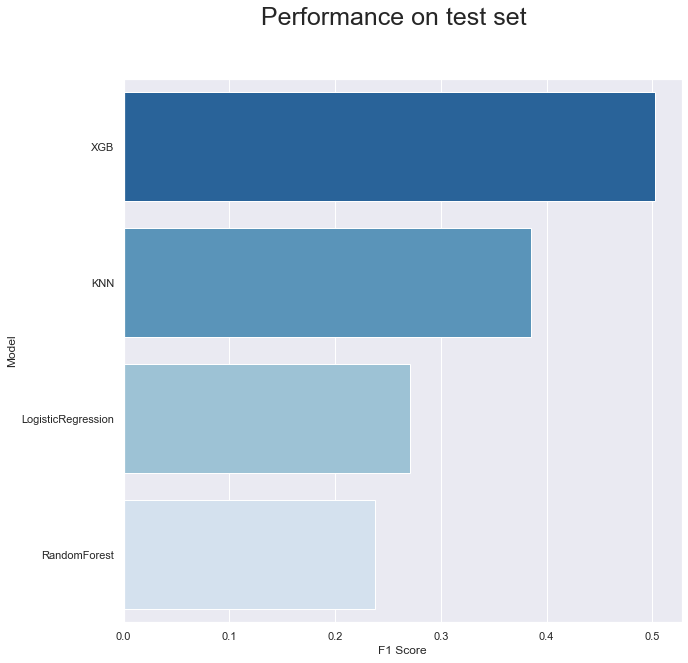

In [39]:
# Ranking accuracy of the models based on scores
ranking = ranking_accuracy(scores)

In [40]:
# Set a model number according to the ranking order to test its performance
model_number = 0

In sample accuracy:
             precision  recall  f1-score  support     pred  AUC
0                  1.0     1.0       1.0  22232.0  22232.0  1.0
1                  1.0     1.0       1.0  22232.0  22232.0  1.0
avg / total        1.0     1.0       1.0  44464.0  44464.0  1.0


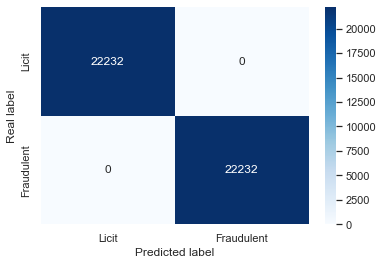

AUC:  1.0


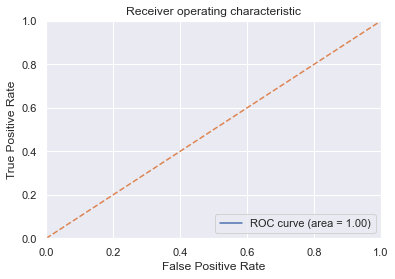

Out sample accuracy:
             precision    recall  f1-score  support    pred       AUC
0             0.962368  0.965123  0.963744   5591.0  5607.0  0.840331
1             0.512500  0.492788  0.502451    416.0   400.0  0.840327
avg / total   0.931214  0.932412  0.931798   6007.0  6007.0  0.840327


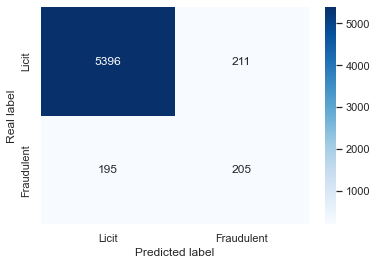

AUC:  0.8403267442180427


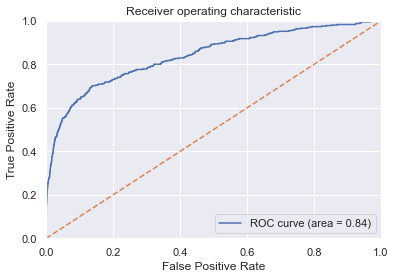

In [41]:
# Check performance of best model
best_model_performance(ranking, model_number, class_labels, X_train, X_test, y_train, y_test)

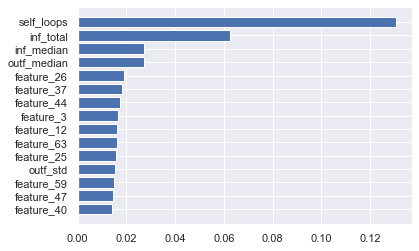

[39, 46, 58, 81, 24, 62, 11, 2, 43, 36, 25, 84, 79, 75, 64]

/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and wi

In [42]:
# Rank features importance 
feature_imp_best_model(X_train_original, model_number, ranking)

## Trans2Vec

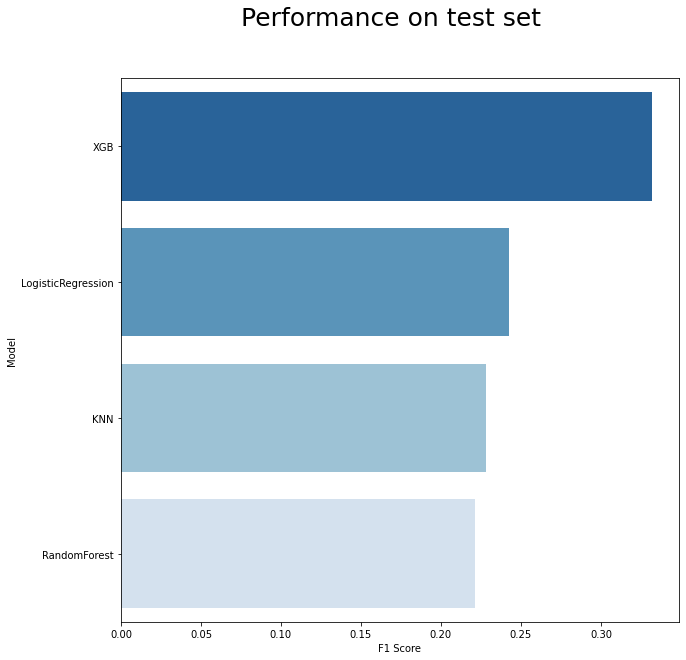

In [11]:
# Ranking accuracy of the models based on scores
ranking_2 = ranking_accuracy(scores_2)

In [21]:
# Set a model number to test its performance
model_number = 0

/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In sample accuracy:
             precision  recall  f1-score  support     pred  AUC
0                  1.0     1.0       1.0  22232.0  22232.0  1.0
1                  1.0     1.0       1.0  22232.0  22232.0  1.0
avg / total        1.0     1.0       1.0  44464.0  44464.0  1.0


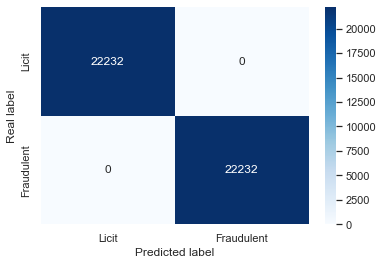

AUC:  1.0


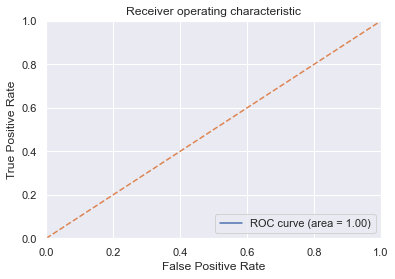

Out sample accuracy:
             precision    recall  f1-score  support    pred       AUC
0             0.950917  0.945985  0.948444   5591.0  5562.0  0.772685
1             0.321348  0.343750  0.332172    416.0   445.0  0.772682
avg / total   0.907318  0.904278  0.905766   6007.0  6007.0  0.772682


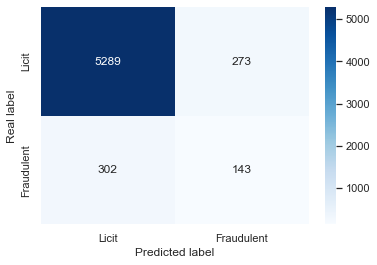

AUC:  0.7726824016620116


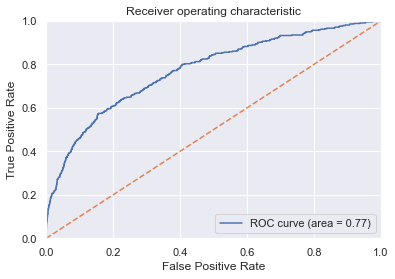

In [22]:
# Check performance of best model
best_model_performance(ranking_2,  model_number, class_labels, X_train_2, X_test_2, y_train_2, y_test_2)

/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


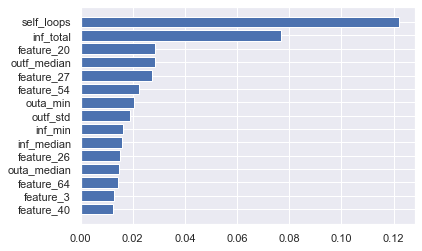

[39, 2, 63, 74, 25, 79, 78, 81, 73, 53, 26, 84, 19, 75, 64]

/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/Users/d.gorgan/.pyenv/versions/3.8.12/lib/python3.8/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and wi

In [23]:
# Rank features importance 
feature_imp_best_model(X_train_original_2, model_number, ranking_2)